<a href="https://colab.research.google.com/github/PankajMoolrajani/PermCutter/blob/main/RBAC%20-%20Workbench.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install sqlalchemy
!pip install ipysigma
!pip install ipywidgets
!pip install igraph
!pip install networkx
!pip install 'networkx<2.7'

ERROR: Operation cancelled by user
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 34.2 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.1
    Uninstalling networkx-3.1:
      Successfully uninstalled networkx-3.1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3
import networkx as nx
from ipysigma import Sigma, SigmaGrid

ModuleNotFoundError: ignored

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
# theme
text_color_light = "#FFFFFF"
text_color_dark = "#070707"
primary_color_dark = "#FF9900"
primary_color_light = "#FFF0AA"
green_color = "#6BAE3D"
red_color = "#FC584C"
color_purple = "#A166FF"
color_blue = "#527FFF"
color_cyan = "#18A2C7"
color_turquoise = "#56C0A7"
background_color = "#212121"
edge_color = "#CAF0F8"

In [ ]:
def get_db_conn():
  db_path = "/content/drive/Shareddrives/Engineering/0 Teams/Security/Projects/[PIAM] Workbench/data-v2-2.db"
  db=sqlite3.connect(f"{db_path}")
  return db

# df functions

In [ ]:
def get_df_u_ro():
  db = get_db_conn()
  query = """
    SELECT u.name as user, ro.name as role
    FROM users as u
    JOIN roles as ro ON u.role_id = ro.id
  """

  results = db.execute(query)

  df = pd.DataFrame(
      results,
      columns=[
        "user", "role"
      ])
  return df

In [ ]:
def get_df_all_rp_counts():
  db = get_db_conn()
  query = """
    SELECT roles.name as role,
      SUM(role_permissions.is_accessible) as count_accessible,
      SUM(role_permissions.is_accessed) as count_accessed,
      SUM(role_permissions.pur) as sum_pur,
      SUM(role_permissions.upr) as sum_upr,
      COUNT(role_permissions.id) as count
    FROM role_permissions
    JOIN roles ON role_permissions.role_id = roles.id
    GROUP BY roles.id, roles.name
    ORDER BY roles.name;
  """

  results = db.execute(query)

  df = pd.DataFrame(
      results,
      columns=[
        "role", "count_accessible", "count_accessed",
        "sum_pur", "sum_upr", "count"
      ])
  return df



In [ ]:
# df for showing the all the role permissions
def get_df_all_rp():
  db = get_db_conn()
  query = """
    SELECT roles.name as ro, resources.name as r, resource_types.name as rt, action as a, is_accessible as is_accessible, is_accessed as is_accessed,
    pur, upr
    FROM role_permissions
    JOIN roles ON role_permissions.role_id = roles.id
    JOIN resources on role_permissions.resource_id = resources.id
    JOIN resource_types on role_permissions.resource_type_id = resource_types.id
    ORDER BY roles.name
    LIMIT 50000;
  """

  results = db.execute(query)

  df = pd.DataFrame(results, columns=["ro", "r", "rt", "a", "is_accessible", "is_accessed", "pur", "upr"])
  df_with_permissions = df.copy()
  df_with_permissions['permission'] = df['r'] + "--" + df['a']
  return df_with_permissions
  # df.to_csv("data.csv", sep=',', index=False, encoding='utf-8')

In [ ]:
# df for showing the all the role permissions
def get_df_ro_accessible_vs_accessed():
  db = get_db_conn()
  query = """
    SELECT roles.name as ro, resources.name as r, action as a, is_accessible as is_accessible, is_accessed as is_accessed
    FROM role_permissions
    JOIN roles ON role_permissions.role_id = roles.id
    JOIN resources on role_permissions.resource_id = resources.id
    ORDER BY roles.name
    LIMIT 50000;
  """

  results = db.execute(query)

  df = pd.DataFrame(results, columns=["ro", "r", "a", "is_accessible", "is_accessed"])
  df_with_permissions = df.copy()
  df_with_permissions['permission'] = df['r'] + "--" + df['a']
  return df_with_permissions

In [ ]:
# df for showing resource types accessed by each role
# df for showing the all the role permissions
def get_df_ro_rt_pur():
  db = get_db_conn()
  query = """
    SELECT ro.name as ro, rt.name as rt, sum(rp.pur) as sum_pur
    FROM role_permissions as rp
    JOIN roles as ro ON rp.role_id = ro.id
    JOIN resource_types as rt on rp.resource_type_id = rt.id
    group by ro, rt
    LIMIT 50000;
  """

  results = db.execute(query)

  df = pd.DataFrame(results, columns=["ro", "rt", "sum_pur"])
  return df

In [ ]:
def get_rp_counts_from_df(df):
  # print (df)
  upr_df = df.groupby(['ro'])['pur'].mean().reset_index()
  upr_df['upr'] = 1 - upr_df['pur']
  return upr_df

# graph functions

In [ ]:
def get_u_ro_graph(df, file_path):
  G = nx.Graph([])
  for i, row in df.iterrows():
    G.add_node(row.role, color=primary_color_dark, label=row.role, node_type="role")
    G.add_node(row.user, color=primary_color_light, label=row.user, node_type="user")
    G.add_edge(row.role, row.user, color=edge_color)
  nx.write_gexf( G , file_path )
  return Sigma(G, node_size=G.degree, node_metrics=["louvain"])

df = get_df_u_ro()
graph = get_u_ro_graph(df, "graph-u-ro.gexf")
graph

Sigma(nx.Graph with 105 nodes and 100 edges)

In [ ]:
def get_rp_graph(df, file_path, change_access_colors):
  G = nx.Graph([])
  for i, row in df.iterrows():
    edcolor=edge_color
    G.add_node(row.ro, color=primary_color_dark, label=row.ro, node_type="role")
    G.add_node(row.permission, color=color_blue, lablel="", node_type="permission")
    if change_access_colors:
      edcolor = green_color if row.is_accessible == 1 and row.is_accessed == 1 else red_color
    G.add_edge(row.ro, row.permission, color=edcolor)
  nx.write_gexf(G , file_path )
  node_metrics = nx.algorithms.community.modularity_max.greedy_modularity_communities(G)
  return Sigma(G, node_size=G.degree, node_metrics=['louvain'], height=800)

In [ ]:
# graph for all accessible permissions for all roles
df = get_df_all_rp()
df_accessible = df.copy()

df_accessible = df_accessible[(df_accessible['is_accessible'] == 1)]
graph = get_rp_graph(df_accessible, "graph-rp-accessible.gexf", change_access_colors=False)
graph

Sigma(nx.Graph with 1,469 nodes and 4,740 edges)

In [ ]:
# graph for all accessed permissions for all roles
df = get_df_all_rp()
df_accessed = df.copy()
df_accessed = df_accessed[(df_accessed['is_accessed'] == 1)]
graph = get_rp_graph(df_accessed, "graph-rp-accessed.gexf", change_access_colors=False)
graph

Sigma(nx.Graph with 1,305 nodes and 2,723 edges)

In [ ]:
def get_ro_rt_graph(df, file_path, change_access_colors):
  G = nx.Graph([])
  for i, row in df.iterrows():
    edcolor=edge_color
    G.add_node(row.ro, color=primary_color_dark, label=row.ro, node_type="ro")
    G.add_node(row.rt, color=color_cyan, lablel="", node_type="rt")
    if change_access_colors:
      edcolor = red_color if row.sum_pur == 0 else green_color
    G.add_edge(row.ro, row.rt, color=edcolor)
  nx.write_gexf(G , file_path )
  # node_metrics = nx.algorithms.community.modularity_max.greedy_modularity_communities(G)
  return Sigma(G, node_size=G.degree, node_metrics=['louvain'], height=800)

In [ ]:
# graph for what resource types are accessible to a role
df = get_df_ro_rt_pur()
graph = get_ro_rt_graph(df, "graph-ro-rt-accessible.gexf", True)
graph

Sigma(nx.Graph with 9 nodes and 20 edges)

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

In [ ]:
# graph after removing unused resource types
df_ro_rt_pur = get_df_ro_rt_pur()
df_ro_rt_pur_zero = df_ro_rt_pur.loc[df_ro_rt_pur['sum_pur'] == 0]

df_rp_used_rt = get_df_all_rp()
print (df_rp_used_rt.shape)
for i, row in df_ro_rt_pur_zero.iterrows():
  # print (row.ro)
  # print (row.rt)
  rows_to_drop = df_rp_used_rt[(df_rp_used_rt['ro'] == row.ro) & (df_rp_used_rt['rt'] == row.rt) | (df_rp_used_rt['is_accessible'] != 1)].index
  df_rp_used_rt.drop(rows_to_drop, inplace=True)

print (df_rp_used_rt.shape)
graph = get_rp_graph(df_rp_used_rt,"graph-rp-used-rt.gexf", change_access_colors=True)
graph


NameError: ignored

In [ ]:
# graph after removing unused permissions
df_rp_accessed = df_rp_used_rt.copy()
df_rp_accessed = get_df_all_rp()
# rows_to_drop = df_rp_accessed[(df_rp_used_rt['is_accessed'] != 1) | (df_rp_used_rt['is_accessible'] != 1) ].index
# | (df_rp_used_rt['pur'] > 0)
# df_rp_accessed.drop(rows_to_drop, inplace=True)

print (df_rp_accessed.shape)
graph = get_rp_graph(df_rp_accessed,"graph-rp-accessed.gexf", change_access_colors=True)
# graph = get_rp_graph(df_p_,"graph-rp-accessed.gexf", change_access_colors=False)

graph


(7320, 9)


Sigma(nx.Graph with 1,469 nodes and 7,320 edges)

In [ ]:
# graph for all permissions upr<0.2
threshold=0.90
df = get_df_all_rp()
df_upr_threshold = df.copy()
df_upr_threshold = df_upr_threshold[(df_upr_threshold['upr'] < threshold) & (df_upr_threshold['is_accessed'] == 1)]
# df_upr_threshold = df_upr_threshold[(df_upr_threshold['is_accessed'] == 1)]

graph = get_rp_graph(df_upr_threshold, "graph-rp-upr-threshold.gexf", change_access_colors=False)
graph

Sigma(nx.Graph with 1,152 nodes and 1,729 edges)

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

# chart functions

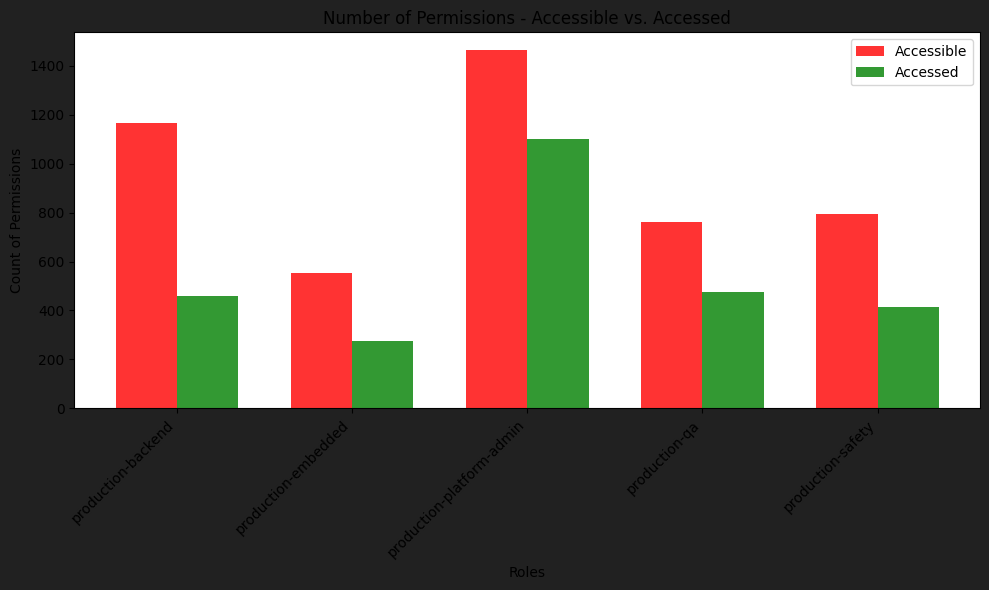

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def get_accessible_vs_accessed_plot(df):
    # Plot the graph
    plt.figure(figsize=(10, 6),  facecolor=background_color)  # Set the figure size (optional)

    bar_width = 0.35  # Width of the bars
    roles = np.arange(len(df["role"]))

    # Bar for "Accessible" permissions
    plt.bar(roles, df["count_accessible"], label="Accessible", color='red', alpha=0.8, width=bar_width)

    # Bar for "Accessed" permissions (shifted by bar_width to create side-by-side bars)
    plt.bar(roles + bar_width, df["count_accessed"], label="Accessed", color='green', alpha=0.8, width=bar_width)

    plt.xlabel("Roles")
    plt.ylabel("Count of Permissions")
    plt.title("Number of Permissions - Accessible vs. Accessed")
    plt.legend()  # Show the legend

    plt.xticks(roles + bar_width/2, df['role'], rotation=45, ha='right')  # Set x-axis ticks

    plt.tight_layout()  # Ensure the labels are not cut off
    return plt

# Assuming you have defined a function get_df_all_rp_counts() that returns the DataFrame containing the required data
df = get_df_all_rp_counts()
plt = get_accessible_vs_accessed_plot(df)
plt.show()


Average UPR of all roles: 0.93



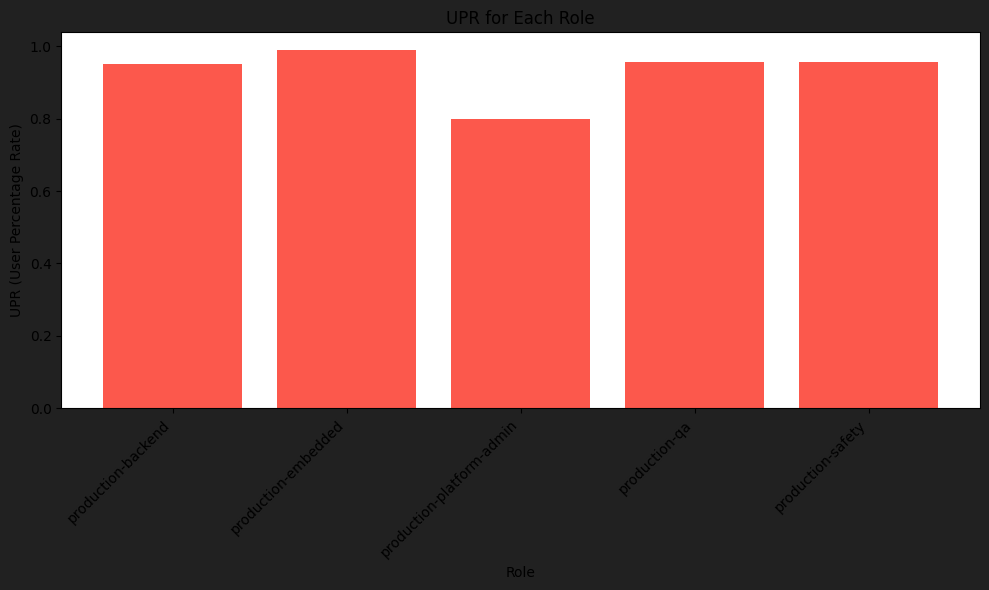

In [ ]:
# get plot for upr for each role + avg upr of all roles
def get_ro_upr_bar_plot(df):
  # Calculate UPR using the given formula
  df['upr'] = df['sum_upr'] / df['count']

  # Plot the bar chart
  plt.figure(figsize=(10, 6), facecolor=background_color)
  plt.bar(df['role'], df['upr'], color=red_color)
  plt.xlabel('Role')
  plt.ylabel('UPR (User Percentage Rate)')
  plt.title('UPR for Each Role')
  plt.xticks(rotation=45, ha='right')
  plt.tight_layout()
  average_upr = df['upr'].mean()
  print(f"Average UPR of all roles: {average_upr:.2f}\n")
  return plt

df = get_df_all_rp_counts()
df.head()
plt = get_ro_upr_bar_plot(df)
plt.show()

Average UPR of all roles: 0.85



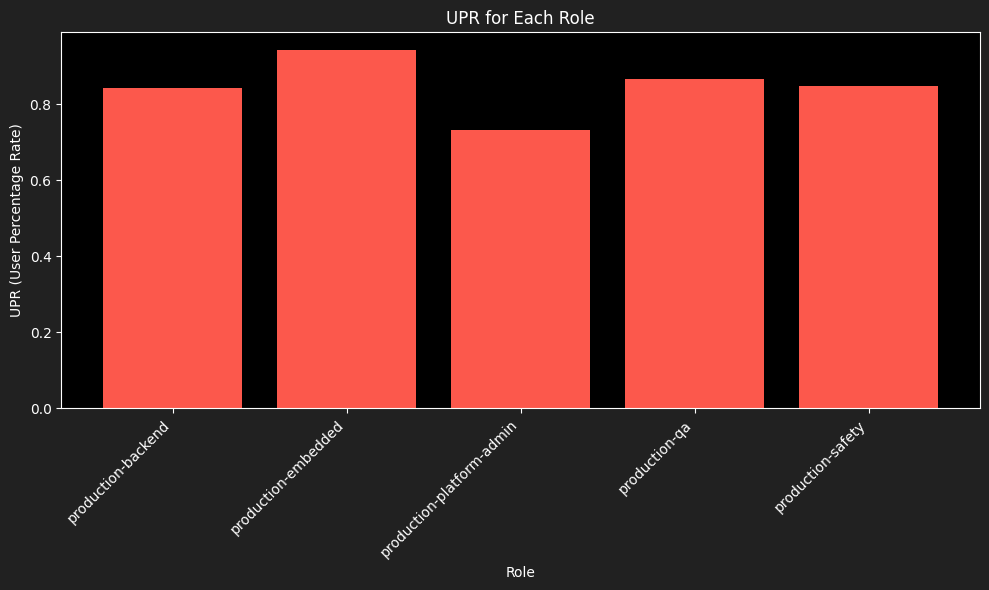

In [ ]:
import matplotlib.pyplot as plt

# get plot for upr for each role + avg upr of all roles
# after removing unused services

def get_upr_plot(df):
  plt.style.use("dark_background")
  plt.figure(figsize=(10, 6), facecolor=background_color)
  plt.bar(df['ro'], df['upr'], color=red_color)
  plt.xlabel('Role')
  plt.ylabel('UPR (User Percentage Rate)')
  plt.title('UPR for Each Role')
  plt.xticks(rotation=45, ha='right')
  plt.tight_layout()
  average_upr = df['upr'].mean()
  print(f"Average UPR of all roles: {average_upr:.2f}\n")
  return plt

df_accessed = get_df_all_rp()
df_accessed = df_accessed[(df_accessed['is_accessed'] == 1)]
# df = df_accessed.copy()
df_accessed = get_rp_counts_from_df(df_accessed)
plt = get_upr_plot(df_accessed)
plt.show()

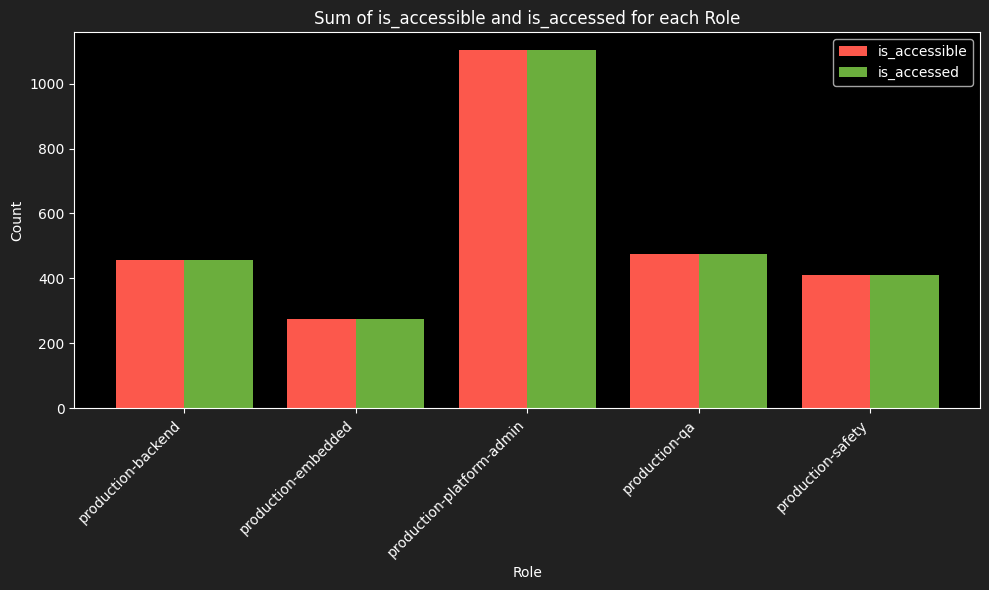

In [ ]:

def get_rp_accessed_plt(df):
  grouped_df = df.groupby('ro').agg({'is_accessible': 'sum', 'is_accessed': 'sum'}).reset_index()
  #Plotting the stacked bar chart
  plt.figure(figsize=(10, 6), facecolor=background_color)
  bar_width = 0.4
  index = grouped_df.index

  plt.bar(index, grouped_df['is_accessible'], bar_width, label='is_accessible', color=red_color)
  plt.bar(index + bar_width, grouped_df['is_accessed'], bar_width, label='is_accessed', color=green_color)

  plt.xlabel('Role')
  plt.ylabel('Count')
  plt.title('Sum of is_accessible and is_accessed for each Role')
  plt.xticks(index + bar_width/2, grouped_df['ro'], rotation=45, ha='right')
  plt.legend()
  plt.tight_layout()
  return plt
  plt.show()

df_rp_accessed = get_df_all_rp()
rows_to_drop = df_rp_accessed[(df_rp_accessed['is_accessed'] == 0)].index
df_rp_accessed = df_rp_accessed.drop(rows_to_drop)

plt = get_rp_accessed_plt(df_rp_accessed)
plt.show()

# display

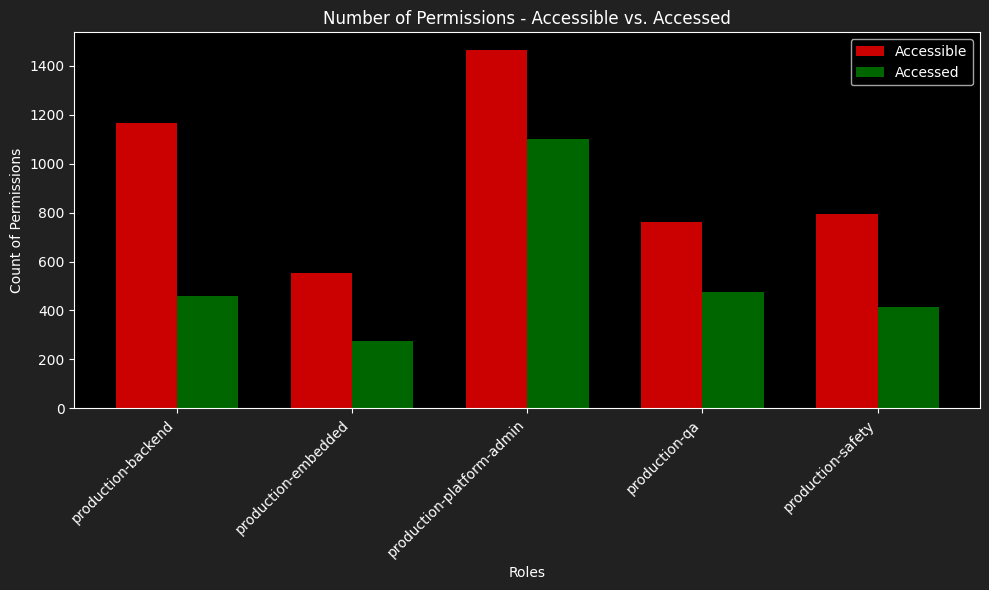

In [ ]:
# show accessible vs accessed in without premission reduction
df = get_df_all_rp_counts()
plt = get_accessible_vs_accessed_plot(df)
plt.show()

In [ ]:
# graph - accessible role and permissions
df = get_df_all_rp()
df_accessible = df.copy()
df_accessible = df_accessible[(df_accessible['is_accessible'] == 1)]
graph = get_rp_graph(df, "graph-rp-accessible.gexf", change_access_colors=False)
graph

Sigma(nx.Graph with 1,469 nodes and 7,320 edges)

In [ ]:
# graph - accessed role and permissions
df = get_df_all_rp()
df_accessed = df.copy()
df_accessed = df_accessed[(df_accessed['is_accessed'] == 1)]
graph = get_rp_graph(df, "graph-rp-accessed.gexf", change_access_colors=False)
graph

Sigma(nx.Graph with 1,469 nodes and 7,320 edges)

In [ ]:
import networkx as nx
from ipysigma import Sigma
import matplotlib.pyplot as plt
def create_ro_rt_graph(df, file_path):
    G = nx.Graph([])
    for i, row in df.iterrows():
      G.add_node(row.ro, color=primary_color_dark, label=row.ro, node_type="role", size=500)
      G.add_node(row.rt, color=primary_color_light, label=row.rt, node_type="resource_type", size=200)
      # edcolor=edge_color
      edcolor = edge_color if row.sum_pur > 0.1 else red_color
      G.add_edge(row.ro, row.rt, color=edcolor)
    nx.write_gexf( G , file_path )
    return Sigma(G, node_size=G.degree, node_metrics=["louvain"])

In [ ]:
df = get_df_ro_rt_pur()
graph = create_ro_rt_graph(df, "graph-ro-rt-pur.gexf")
graph

Sigma(nx.Graph with 9 nodes and 20 edges)

In [ ]:
# Question - count of roles having read permission to each secret

def get_sqlite_table_schema(db_path):
    try:
        # Connect to the SQLite database
        database_path = db_path
        conn = sqlite3.connect(database_path)
        cursor = conn.cursor()

        # Get the list of tables in the database
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        tables = cursor.fetchall()

        schema_info = {}

        # Loop through each table and fetch its schema
        for table in tables:
            table_name = table[0]
            cursor.execute(f"PRAGMA table_info({table_name});")
            columns = cursor.fetchall()

            # Create a list to store the column names and their types
            table_schema = []

            # Loop through the columns and extract their names and types
            for column in columns:
                column_name = column[1]
                data_type = column[2]
                table_schema.append((column_name, data_type))

            # Add the table's schema to the dictionary
            schema_info[table_name] = table_schema

        # Close the database connection
        cursor.close()
        conn.close()

        return schema_info

    except sqlite3.Error as e:
        print(f"Error while connecting to SQLite database: {e}")
        return None

schema = get_sqlite_table_schema()
print (schema)


TypeError: ignored

In [ ]:
import networkx as nx
from ipysigma import Sigma
import matplotlib.pyplot as plt

def get_role_resource_type_usage():
  data = [
      ["production-backend", "rds", 25, 16],
      ["production-backend", "secretsmanager", 32, 19],
      ["production-backend", "cloudfront", 19, 0],
      ["production-backend", "hsm", 28, 0],
      ["production-embedded", "rds", 30, 16],
      ["production-embedded", "secretsmanager", 12, 8],
      ["production-embedded", "ecr", 17, 0],
      ["production-platform-admin", "rds", 105, 45],
      ["production-platform-admin", "secretsmanager", 80, 13],
      ["production-platform-admin", "hsm", 21, 0],
      ["production-qa", "rds", 45, 17],
      ["production-qa", "hsm", 23, 0],
      ["production-qa", "secretsmanager", 12, 0],
      ["production-safety", "rds", 45, 22],
      ["production-safety", "secretsmanager", 29, 5],
      ["production-safety", "hsm", 33, 4],
  ]

  columns = ["role", "rt", "sum_accessible", "sum_accessed"]

  df = pd.DataFrame(data, columns=columns)
  return df

# def create_node_graph(df):
#     # Convert the NetworkX graph to a format suitable for ipysigma
#     G = nx.Graph([])
#     for i, row in df.iterrows():
#       G.add_edge(row.role, row.rt)
#     return Sigma(G, node_size=G.degree, node_metrics=["louvain"])

import networkx as nx
from ipysigma import Sigma

def create_node_graph(df):
    # Convert the NetworkX graph to a format suitable for ipysigma
    G = nx.Graph()

    for i, row in df.iterrows():
        G.add_node(row['role'], color='blue', label=row['role'])
        G.add_node(row['rt'], color='lightgrey', label=row['rt'])
        edge_color = 'red' if row['sum_accessed'] == 0 else 'black'
        G.add_edge(row['role'], row['rt'], color=edge_color)

    # Node size based on degree
    # node_size = dict(G.degree())

    # Node metrics for community detection (louvain algorithm)
    # node_metrics = nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

    return Sigma(G, node_size=G.degree, node_metrics=["louvain"])

df = get_role_resource_type_usage()
create_node_graph(df)